# Casia Webface dataset


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

# Install required libraries
!pip install numpy tensorflow kaggle

# Install Kaggle package
!pip install kaggle

# Move the API Key from Google Drive to the correct location
!mkdir -p ~/.kaggle
!cp /content/gdrive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset
!kaggle datasets download -d kenny3s/casia-webface

# Unzip the dataset
import zipfile
with zipfile.ZipFile('casia-webface.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/casia-webface')


# Casia WebFace dataset info and image examples

Total Persons: 10575
Total Images: 452960


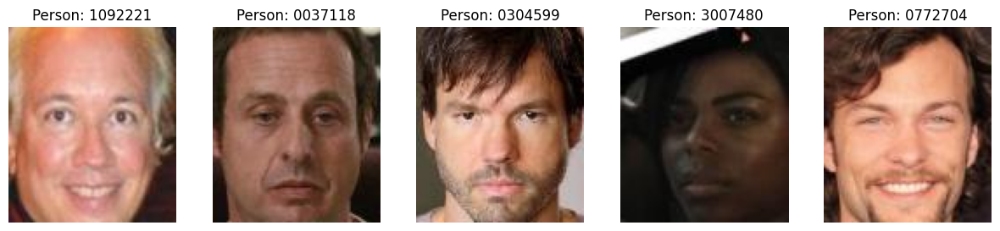

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to show 1 image for 5 random persons in one figure
def show_one_image_per_random_person_single_figure(dataset_path, num_persons=5):
    # Get a list of all person folders in the dataset
    all_persons = [person_folder for person_folder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, person_folder))]

    # Randomly select 5 persons
    selected_persons = random.sample(all_persons, min(num_persons, len(all_persons)))

    # Create a subplot with 1 row and 5 columns
    plt.figure(figsize=(15, 3))

    # Counter to keep track of the number of persons displayed
    count = 0

    # Iterate through the randomly selected persons
    for person_folder in selected_persons:
        person_path = os.path.join(dataset_path, person_folder)

        # Get the first image in the person's folder
        image_files = os.listdir(person_path)
        if image_files:
            image_file = image_files[0]
            image_path = os.path.join(person_path, image_file)

            # Display the image using matplotlib
            img = mpimg.imread(image_path)

            # Create a subplot for the current person
            plt.subplot(1, num_persons, count + 1)
            plt.imshow(img)
            plt.title(f"Person: {person_folder}")
            plt.axis('off')

            # Increment the counter
            count += 1

    # Show the figure
    plt.show()

def calculate_total_persons_and_images(dataset_path):
    # Variables to store the total number of persons and images
    total_persons = 0
    total_images = 0

    # Iterate through each folder (each person) in the dataset
    for person_folder in os.listdir(dataset_path):
        person_path = os.path.join(dataset_path, person_folder)

        # Check if it's a directory
        if os.path.isdir(person_path):
            # Increment the total number of persons
            total_persons += 1

            # Get the image files in the person's folder and increment the total number of images
            image_files = os.listdir(person_path)
            total_images += len(image_files)

    return total_persons, total_images

# Define the path to the dataset in Colab
dataset_path_colab = '/content/casia-webface/datasets'

# Calculate total persons and images in the dataset
total_persons, total_images = calculate_total_persons_and_images(dataset_path_colab)

# Print the results
print(f"Total Persons: {total_persons}")
print(f"Total Images: {total_images}")

# Show 1 image for 5 random persons in one figure
show_one_image_per_random_person_single_figure(dataset_path_colab)


# Facenet


/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


1/1 [==============================] - 0s 55ms/step


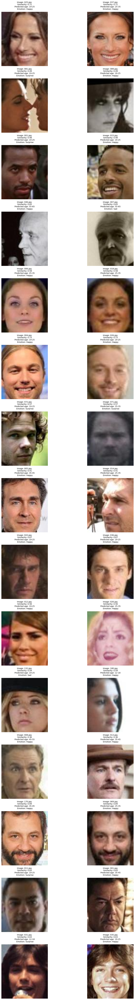

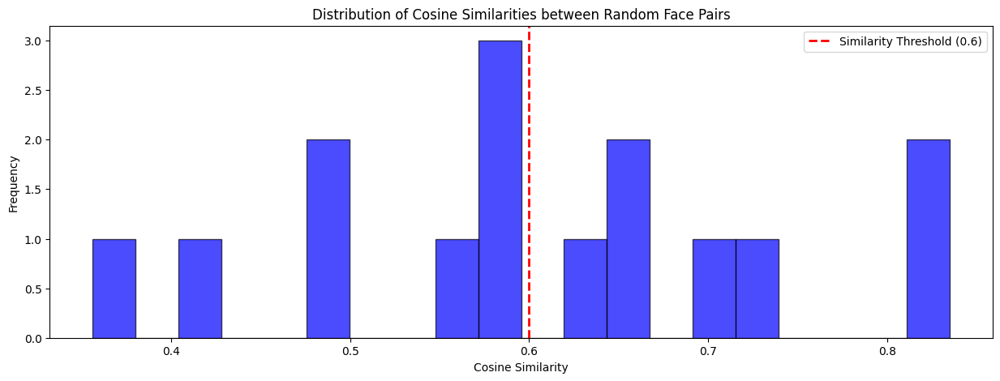

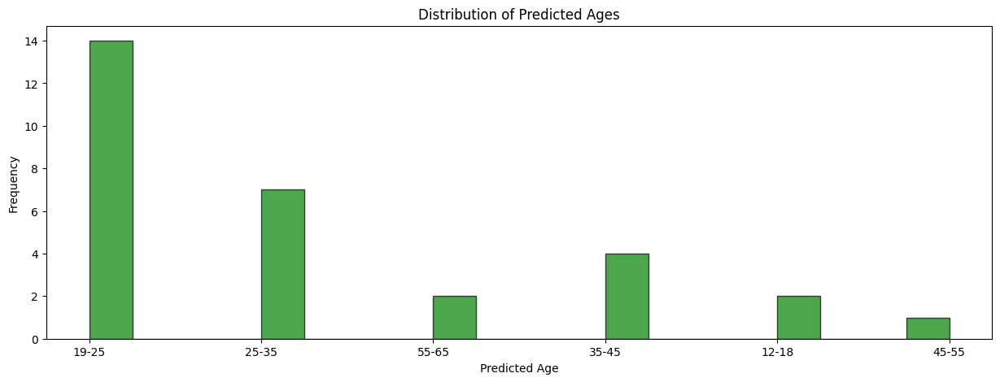

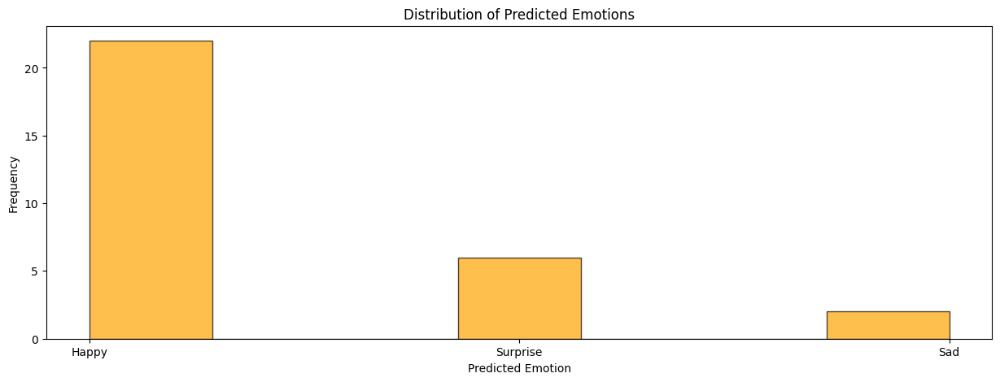

In [67]:
import os
import random
import tensorflow as tf
import tensorflow_hub as hub
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from transformers import ViTForImageClassification, ViTFeatureExtractor
from tensorflow.keras.models import load_model

# Install necessary packages
!pip install opencv-python-headless
!pip install transformers

# Load FaceNet model from TensorFlow Hub
face_model_url = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4"
face_model = hub.load(face_model_url)

# Load age estimation model from Hugging Face Transformers (ViT)
age_model = ViTForImageClassification.from_pretrained('nateraw/vit-age-classifier')
age_transforms = ViTFeatureExtractor.from_pretrained('nateraw/vit-age-classifier')

# Load pre-trained cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load pre-trained facial emotion recognition model
emotion_model = load_model('/content/gdrive/MyDrive/Model/model_v6_23.hdf5')

# Set the dataset folder
dataset_folder = "/content/casia-webface/datasets"

# Ensure the folder exists
if not os.path.exists(dataset_folder):
    os.makedirs(dataset_folder)

# Function to calculate FaceNet embedding
def calculate_embedding(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = tf.image.resize(img, (160, 160))
    img = tf.expand_dims(img, axis=0)
    img = img / 255.0
    embedding = face_model(img)
    return tf.reshape(embedding, [-1]).numpy()

# Function to predict age using ViT
def predict_age(image_path):
    age_img = cv2.imread(image_path)
    age_img = cv2.cvtColor(age_img, cv2.COLOR_BGR2RGB)
    age_inputs = age_transforms(images=age_img, return_tensors="pt")
    age_outputs = age_model(**age_inputs)
    age_logits = age_outputs.logits
    predicted_age = torch.argmax(age_logits[0]).item()
    return predicted_age

# Function to predict emotion using the pre-trained model
def predict_emotion(image_path):
    emotion_img = cv2.imread(image_path)
    emotion_img_gray = cv2.cvtColor(emotion_img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    emotion_img_resized = cv2.resize(emotion_img_gray, (48, 48))
    emotion_img_resized = np.expand_dims(emotion_img_resized, axis=-1)  # Add channel dimension
    emotion_img_resized = np.expand_dims(emotion_img_resized, axis=0) / 255.0  # Normalize
    predicted_emotion = emotion_model.predict(emotion_img_resized)
    predicted_emotion_label = np.argmax(predicted_emotion)
    return predicted_emotion_label

num_people=15

# Set up subplots with histograms, images, and names of images
fig, axs = plt.subplots(num_people, 2, figsize=(15, 5 * num_people))

# Lists to store cosine similarities, predicted ages, and predicted emotions
similarities = []
predicted_ages = []
predicted_emotions = []

# Iterate through a limited number of subfolders in the dataset folder
for i, person_folder in enumerate(random.sample(os.listdir(dataset_folder), num_people)):
    person_folder_path = os.path.join(dataset_folder, person_folder)

    if os.path.isdir(person_folder_path):
        images = []

        all_images = os.listdir(person_folder_path)
        random_images = random.sample(all_images, 2)

        # Calculate cosine similarity between random pair of images
        embedding1 = calculate_embedding(os.path.join(person_folder_path, random_images[0]))
        embedding2 = calculate_embedding(os.path.join(person_folder_path, random_images[1]))
        similarity = cosine_similarity([embedding1], [embedding2])[0, 0]

        # Store similarity in the list
        similarities.append(similarity)

        # Use ViT for age prediction on both images
        for k, age_image_name in enumerate(random_images):
            age_image_path = os.path.join(person_folder_path, age_image_name)

            # Predict age for the face using ViT
            predicted_age = predict_age(age_image_path)
            age_labels = ["0-2","3-12", "12-18", "19-25","25-35", "35-45", "45-55", "55-65", "65+",]
            predicted_ages.append(age_labels[predicted_age])

            # Predict emotion for the face
            predicted_emotion = predict_emotion(age_image_path)
            emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
            predicted_emotions.append(emotion_labels[predicted_emotion])

            # Display the names of images above the histogram
            axs[i, k].set_title(
                f"Image: {age_image_name} \n Similarity: {similarity:.2f} \n Predicted age: {age_labels[predicted_age]} \n Emotion: {emotion_labels[predicted_emotion]}",
                fontsize=10, y=1.02)

            # Display the image
            img = cv2.imread(os.path.join(person_folder_path, age_image_name))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axs[i, k].imshow(img)
            axs[i, k].axis('off')

# Display the histograms
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
similarity_threshold=0.6
# Plot histogram of cosine similarities
plt.figure(figsize=(15, 5))
plt.hist(similarities, bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.title('Distribution of Cosine Similarities between Random Face Pairs')
plt.axvline(x=similarity_threshold, color='red', linestyle='dashed', linewidth=2, label=f'Similarity Threshold ({similarity_threshold})')
plt.legend()
plt.show()

# Plot histogram of predicted ages
plt.figure(figsize=(15, 5))
plt.hist(predicted_ages, bins=20, color='green', edgecolor='black', alpha=0.7)
plt.xlabel('Predicted Age')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Ages')
plt.show()

# Plot histogram of predicted emotions
plt.figure(figsize=(15, 5))
plt.hist(predicted_emotions, bins=7, color='orange', edgecolor='black', alpha=0.7)
plt.xlabel('Predicted Emotion')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Emotions')
plt.show()


# Similarity Calculation

**Load FaceNet Model:** The code uses a pre-trained FaceNet model from TensorFlow Hub for face embedding. The model is loaded using the Inception V3 architecture.

**Load Face Detection Cascade:** It loads a pre-trained Haar cascade classifier for face detection from OpenCV.

**Dataset Preparation:** The code assumes a dataset structure where each person has a folder, and each folder contains multiple images of that person.

**Face Embedding and Similarity Calculation:** For each person, it randomly selects two images, loads and preprocesses them, generates embeddings using the FaceNet model, and calculates the cosine similarity between the embeddings.

**Histogram Plotting:** The code collects the cosine similarities for all pairs of random images and plots a histogram to visualize the distribution. It also includes a red dashed line indicating a similarity threshold.


FaceNet is used to encode facial images into embeddings, and cosine similarity is employed to measure the similarity between pairs of face embeddings. The resulting histogram provides insights into the distribution of similarities among random face pairs.

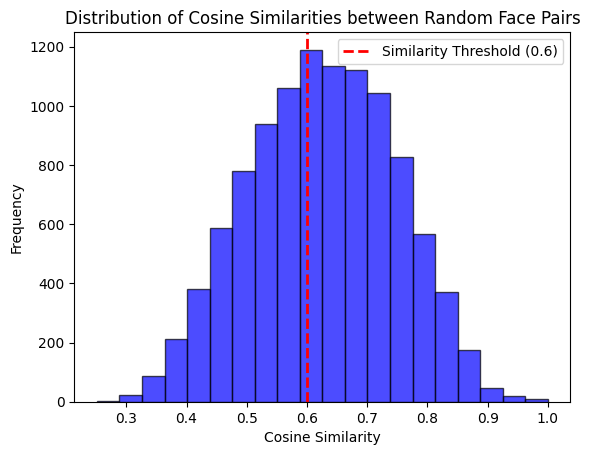

In [ ]:
import os
import random
import tensorflow as tf
import tensorflow_hub as hub
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Install necessary packages
!pip install opencv-python-headless

# Load FaceNet model from TensorFlow Hub
model_url = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4"
model = hub.load(model_url)

# Load pre-trained cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

dataset_folder = "/content/casia-webface/datasets"

# Ensure the folder exists
if not os.path.exists(dataset_folder):
    os.makedirs(dataset_folder)

# Similarity threshold
similarity_threshold = 0.6

# List to store cosine similarities
similarities = []

# Iterate through all subfolders in the dataset folder
for person_folder in os.listdir(dataset_folder):
    person_folder_path = os.path.join(dataset_folder, person_folder)

    if os.path.isdir(person_folder_path):
        images = []

        # Get a list of all images in the person's folder
        all_images = os.listdir(person_folder_path)

        # Randomly select two images
        random_images = random.sample(all_images, 2)

        # Iterate through the random pair of images
        for image_name in random_images:
            image_path = os.path.join(person_folder_path, image_name)

            # Load and preprocess the image
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = tf.image.resize(img, (160, 160))
            img = tf.expand_dims(img, axis=0)
            img = img / 255.0

            # Generate embedding for the face
            embedding = model(img)

            # Add flattened embedding to the list
            images.append({"embedding": tf.reshape(embedding, [-1]).numpy()})

        # Calculate cosine similarity between flattened embeddings
        embedding1 = images[0]["embedding"]
        embedding2 = images[1]["embedding"]
        similarity = cosine_similarity([embedding1], [embedding2])[0, 0]

        # Store similarity in the list
        similarities.append(similarity)

# Plot histogram of cosine similarities
plt.hist(similarities, bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.title('Distribution of Cosine Similarities between Random Face Pairs')
plt.axvline(x=similarity_threshold, color='red', linestyle='dashed', linewidth=2, label=f'Similarity Threshold ({similarity_threshold})')
plt.legend()
plt.show()


# Age prediciton
**Loading Models:**

It loads a FaceNet model from TensorFlow Hub for generating face embeddings.
It loads an age estimation model from Hugging Face Transformers, specifically a Vision Transformer (ViT) pre-trained for image classification.


**Dataset Handling:**

It assumes there is a dataset folder at "/content/casia-webface/datasets."
If the folder doesn't exist, it creates one.


**Age Prediction and Visualization: **

For each person in the dataset, it randomly selects a specified number of images.
For each image:
It uses FaceNet to generate a face embedding.
It uses a ViT model to predict the age of the face in the image.
It stores the predicted age in a list.
It displays the image along with the predicted age in a subplot.


**Histogram Visualization:**

It creates a histogram to visualize the distribution of predicted ages across all processed images.


**Limiting the Number of People Processed:**

The code allows you to set the number of people to process (num_people_to_process) to avoid processing the entire dataset.

This code analyzes a subset of people from a face dataset, predicts their ages using ViT, and visualizes the predicted ages along with the corresponding face images. It also provides a histogram to show the distribution of predicted ages.


FaceNet is used to extract face embeddings (numerical representations) from facial images, and these embeddings are subsequently used as input to a ViT model for age prediction. This approach allows the code to predict the age of individuals based on their facial features captured in the embeddings.

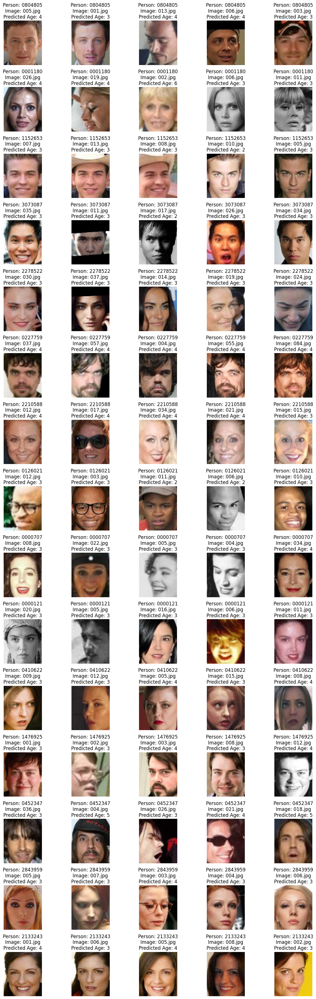

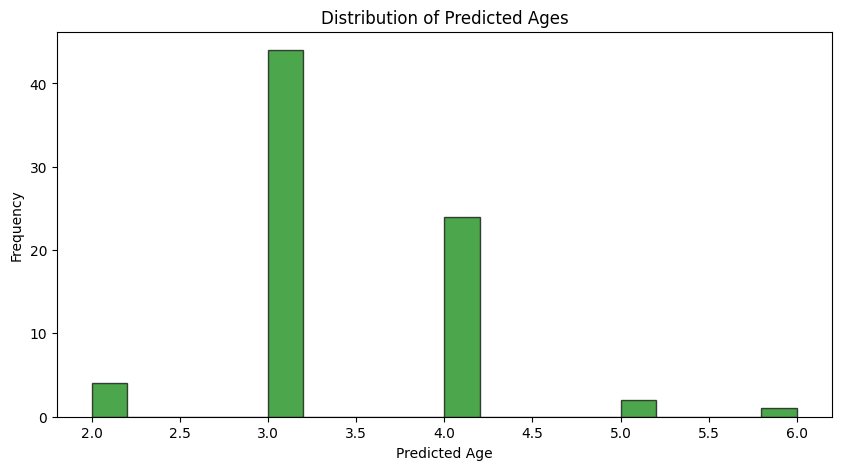

In [42]:
import os
import random
import tensorflow as tf
import tensorflow_hub as hub
import cv2
import matplotlib.pyplot as plt
from transformers import ViTForImageClassification, ViTFeatureExtractor

# Install necessary packages
!pip install opencv-python-headless
!pip install transformers

# Load FaceNet model from TensorFlow Hub
face_model_url = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4"
face_model = hub.load(face_model_url)

# Load age estimation model from Hugging Face Transformers (ViT)
age_model = ViTForImageClassification.from_pretrained('nateraw/vit-age-classifier')
age_transforms = ViTFeatureExtractor.from_pretrained('nateraw/vit-age-classifier')

# Load pre-trained cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

dataset_folder = "/content/casia-webface/datasets"

# Ensure the folder exists
if not os.path.exists(dataset_folder):
    os.makedirs(dataset_folder)

# List to store predicted ages
predicted_ages = []

# Set the number of people to process
num_people_to_process = 15
num_images_per_person = 5
people_processed = 0

# Create subplots with larger spacing between images and histogram
fig, axes = plt.subplots(nrows=num_people_to_process, ncols=num_images_per_person, figsize=(15, 3*num_people_to_process))
fig.subplots_adjust(hspace=0.5)  # Adjust the vertical spacing

# Iterate through all subfolders in the dataset folder
for person_folder in os.listdir(dataset_folder):
    person_folder_path = os.path.join(dataset_folder, person_folder)

    if os.path.isdir(person_folder_path):
        # Get a list of all images in the person's folder
        all_images = os.listdir(person_folder_path)

        # Randomly select images
        random_images = random.sample(all_images, min(num_images_per_person, len(all_images)))

        # Iterate through the random images
        for i, image_name in enumerate(random_images):
            image_path = os.path.join(person_folder_path, image_name)

            # Load and preprocess the image for FaceNet
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = tf.image.resize(img, (160, 160))
            img = img / 255.0

            # Generate embedding for the face using FaceNet
            embedding = face_model(tf.convert_to_tensor([img], dtype=tf.float32))

            # Use ViT for age prediction
            age_image_path = os.path.join(person_folder_path, image_name)
            age_img = cv2.imread(age_image_path)
            age_img = cv2.cvtColor(age_img, cv2.COLOR_BGR2RGB)

            # Use ViTFeatureExtractor for preprocessing
            age_inputs = age_transforms(images=age_img, return_tensors="pt")
            age_pixel_values = age_inputs.pixel_values

            # Predict age for the face using ViT
            age_outputs = age_model(**age_inputs)
            age_logits = age_outputs.logits
            predicted_age = torch.argmax(age_logits[0]).item()

            # Store predicted age in the list
            predicted_ages.append(predicted_age)

            # Display the image along with the predicted age
            ax = axes[people_processed, i]
            ax.imshow(age_img)
            ax.set_title(f'Person: {person_folder}\nImage: {image_name}\nPredicted Age: {predicted_age}')
            ax.axis('off')

        # Increment the count of processed people
        people_processed += 1

        # Check if the desired number of people is reached
        if people_processed >= num_people_to_process:
            break

# Create a new figure for the histogram
plt.figure(figsize=(10, 5))

# Plot histogram of predicted ages
plt.hist(predicted_ages, bins=20, color='green', edgecolor='black', alpha=0.7)
plt.xlabel('Predicted Age')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Ages')
plt.show()


https://github.com/priya-dwivedi/face_and_emotion_detection/blob/master/README.md Emotion


# Other methods...


# Vision Transformers (ViT) age classification without facenet
The code iterates through  subfolder in the dataset, representing an individual person. For selected person, it randomly selects one image from the person's folder, processes and preprocesses that image, then uses the Vision Transformer (ViT) model to predict the age of the person in the selected image. The predicted age is then added to the list predicted_ages.

This approach is suitable for obtaining a random sample from each person in the dataset and predicting their ages. The final histogram provides an overview of the predicted age distribution for the individuals in the dataset.

# Distribution of Predicted Ages from 5 Random Images per Person (for 15 persons in dataset )
In code we choose number of people from dataset

num_people_to_process = 15

num_images=5

Results are show as histogram of predicted ages and displaying images with their corresponding predicted ages.

Age is predicted in classes 1-6

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


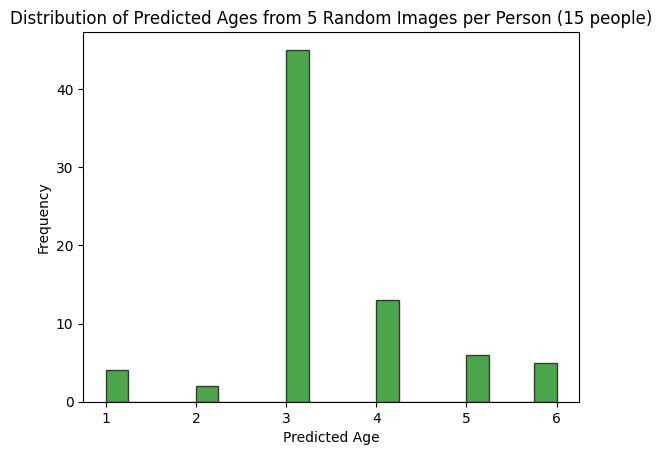

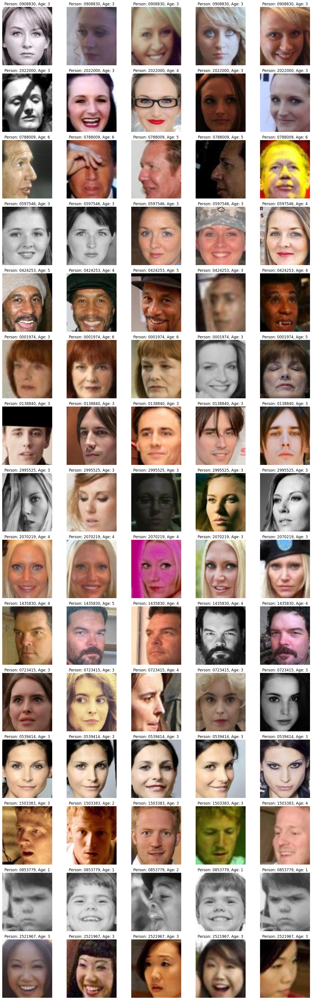

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.metrics.pairwise import cosine_similarity
from transformers import ViTForImageClassification, ViTFeatureExtractor

# Load age estimation model from Hugging Face Transformers (ViT)
model = ViTForImageClassification.from_pretrained('nateraw/vit-age-classifier')
transforms = ViTFeatureExtractor.from_pretrained('nateraw/vit-age-classifier')

# Load pre-trained cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

dataset_folder = "/content/casia-webface/datasets"

# Ensure the folder exists
if not os.path.exists(dataset_folder):
    os.makedirs(dataset_folder)

# List to store predicted ages
predicted_ages = []

# List to store images for display
tested_images = []

# Set the number of people to process
num_people_to_process = 15
people_processed = 0
num_images=5

# Iterate through all subfolders in the dataset folder
for person_folder in os.listdir(dataset_folder):
    person_folder_path = os.path.join(dataset_folder, person_folder)

    if os.path.isdir(person_folder_path):
        # Get a list of all images in the person's folder
        all_images = os.listdir(person_folder_path)

        # Randomly select 5 images
        random_images = random.sample(all_images, min(num_images, len(all_images)))

        # Iterate through the random images
        for random_image in random_images:
            # Load and preprocess the image
            image_path = os.path.join(person_folder_path, random_image)
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Use ViTFeatureExtractor for preprocessing
            inputs = transforms(images=img, return_tensors="pt")
            pixel_values = inputs.pixel_values

            # Predict age for the face
            outputs = model(**inputs)
            logits = outputs.logits
            predicted_age = torch.argmax(logits[0]).item()

            # Store predicted age in the list
            predicted_ages.append(predicted_age)

            # Store image for display
            tested_images.append((img, f'Person: {person_folder}, Age: {predicted_age}'))

        # Increment the count of processed people
        people_processed += 1

        # Check if the desired number of people is reached
        if people_processed >= num_people_to_process:
            break

# Plot histogram of predicted ages
plt.hist(predicted_ages, bins=20, color='green', edgecolor='black', alpha=0.7)
plt.xlabel('Predicted Age')
plt.ylabel('Frequency')
plt.title(f'Distribution of Predicted Ages from 5 Random Images per Person ({num_people_to_process} people)')
plt.show()

# Display tested images
fig, axes = plt.subplots(nrows=num_people_to_process, ncols=5, figsize=(15, 3*num_people_to_process))

for i, (img, title) in enumerate(tested_images):
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


# OpenCV's deep learning face detector
Face Detection and Highlighting:

Utilizes a pre-trained face detection model to detect faces in images.
Highlights detected faces with bounding boxes.
Random Image Processing:

For each person's folder in the dataset:
Checks if there are enough images available; if not, it skips that person.
Randomly selects a specified number of images (default is 5) from the person's folder.
For each selected image:
Reads the image, detects faces, and highlights them.
For each detected face, it extracts the region of interest, preprocesses it, and uses pre-trained models to predict gender and age.
Prints the predicted gender and age for each face.
Displays the processed image with annotations.
Loading Models and Setting Parameters:

Loads pre-trained models for face detection, age prediction, and gender prediction.
Sets parameters such as the mean values for face preprocessing, age and gender lists, and padding.
Executing the Processing of Random Images:

Calls the process_random_images function with the specified dataset folder and the number of images to process per person.

In [ ]:
# Clone the GitHub repository
!git clone https://github.com/CVxTz/face_age_gender.git

# Move to the repository directory
%cd face_age_gender

# Install necessary packages
!pip install opencv-python-headless
!pip install -r requirements.txt

# Run the age and gender detection script
!python age_gender_detection.py --image /content/casia-webface/datasets/0000185/038.jpg
